# Read in the data

In [8]:
import pandas as pd
import numpy
import re
import altair as alt

data_files = [
    "ap_2010.csv",
    "class_size.csv",
    "demographics.csv",
    "graduation.csv",
    "hs_directory.csv",
    "sat_results.csv"
]

data = {}

for f in data_files:
    d = pd.read_csv("schools/{0}".format(f))
    data[f.replace(".csv", "")] = d

# Read in the surveys

In [9]:
all_survey = pd.read_csv("schools/survey_all.txt", delimiter="\t", encoding='windows-1252')
d75_survey = pd.read_csv("schools/survey_d75.txt", delimiter="\t", encoding='windows-1252')
survey = pd.concat([all_survey, d75_survey], axis=0)

survey["DBN"] = survey["dbn"]

survey_fields = [
    "DBN", 
    "rr_s", 
    "rr_t", 
    "rr_p", 
    "N_s", 
    "N_t", 
    "N_p", 
    "saf_p_11", 
    "com_p_11", 
    "eng_p_11", 
    "aca_p_11", 
    "saf_t_11", 
    "com_t_11", 
    "eng_t_11", 
    "aca_t_11", 
    "saf_s_11", 
    "com_s_11", 
    "eng_s_11", 
    "aca_s_11", 
    "saf_tot_11", 
    "com_tot_11", 
    "eng_tot_11", 
    "aca_tot_11",
]
survey = survey.loc[:,survey_fields]
data["survey"] = survey

/home/george/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  This is separate from the ipykernel package so we can avoid doing imports until


# Add DBN columns

In [10]:
data["hs_directory"]["DBN"] = data["hs_directory"]["dbn"]

def pad_csd(num):
    string_representation = str(num)
    if len(string_representation) > 1:
        return string_representation
    else:
        return "0" + string_representation
    
data["class_size"]["padded_csd"] = data["class_size"]["CSD"].apply(pad_csd)
data["class_size"]["DBN"] = data["class_size"]["padded_csd"] + data["class_size"]["SCHOOL CODE"]

# Convert columns to numeric

In [11]:
cols = ['SAT Math Avg. Score', 'SAT Critical Reading Avg. Score', 'SAT Writing Avg. Score']
for c in cols:
    data["sat_results"][c] = pd.to_numeric(data["sat_results"][c], errors="coerce")

data['sat_results']['sat_score'] = data['sat_results'][cols[0]] + data['sat_results'][cols[1]] + data['sat_results'][cols[2]]

def find_lat(loc):
    coords = re.findall("\(.+, .+\)", loc)
    lat = coords[0].split(",")[0].replace("(", "")
    return lat

def find_lon(loc):
    coords = re.findall("\(.+, .+\)", loc)
    lon = coords[0].split(",")[1].replace(")", "").strip()
    return lon

data["hs_directory"]["lat"] = data["hs_directory"]["Location 1"].apply(find_lat)
data["hs_directory"]["lon"] = data["hs_directory"]["Location 1"].apply(find_lon)

data["hs_directory"]["lat"] = pd.to_numeric(data["hs_directory"]["lat"], errors="coerce")
data["hs_directory"]["lon"] = pd.to_numeric(data["hs_directory"]["lon"], errors="coerce")

# Condense datasets

In [12]:
class_size = data["class_size"]
class_size = class_size[class_size["GRADE "] == "09-12"]
class_size = class_size[class_size["PROGRAM TYPE"] == "GEN ED"]

class_size = class_size.groupby("DBN").agg(numpy.mean)
class_size.reset_index(inplace=True)
data["class_size"] = class_size

data["demographics"] = data["demographics"][data["demographics"]["schoolyear"] == 20112012]

data["graduation"] = data["graduation"][data["graduation"]["Cohort"] == "2006"]
data["graduation"] = data["graduation"][data["graduation"]["Demographic"] == "Total Cohort"]

# Convert AP scores to numeric

In [13]:
cols = ['AP Test Takers ', 'Total Exams Taken', 'Number of Exams with scores 3 4 or 5']

for col in cols:
    data["ap_2010"][col] = pd.to_numeric(data["ap_2010"][col], errors="coerce")

# Combine the datasets

In [15]:
combined = data["sat_results"]

combined = combined.merge(data["ap_2010"], on="DBN", how="left")
combined = combined.merge(data["graduation"], on="DBN", how="left")

to_merge = ["class_size", "demographics", "survey", "hs_directory"]

for m in to_merge:
    combined = combined.merge(data[m], on="DBN", how="inner")

#combined = combined.fillna(combined.mean())
combined = combined.fillna(0)

# Add a school district column for mapping

In [16]:
def get_first_two_chars(dbn):
    return dbn[0:2]

combined["school_dist"] = combined["DBN"].apply(get_first_two_chars)

# Find correlations

In [17]:
correlations = combined.corr()
correlations = correlations["sat_score"]
print(correlations)

SAT Critical Reading Avg. Score         0.996986
SAT Math Avg. Score                     0.993137
SAT Writing Avg. Score                  0.997138
sat_score                               1.000000
AP Test Takers                          0.371330
Total Exams Taken                       0.354642
Number of Exams with scores 3 4 or 5    0.329250
Total Cohort                            0.328982
CSD                                     0.080944
NUMBER OF STUDENTS / SEATS FILLED       0.305352
NUMBER OF SECTIONS                      0.296805
AVERAGE CLASS SIZE                      0.326426
SIZE OF SMALLEST CLASS                  0.073062
SIZE OF LARGEST CLASS                   0.378741
SCHOOLWIDE PUPIL-TEACHER RATIO               NaN
schoolyear                                   NaN
fl_percent                                   NaN
frl_percent                            -0.417507
total_enrollment                        0.308198
ell_num                                 0.000867
ell_percent         

# Plotting survey correlations

In [18]:
# Remove DBN since it's a unique identifier, not a useful numerical value for correlation.
survey_fields.remove("DBN")

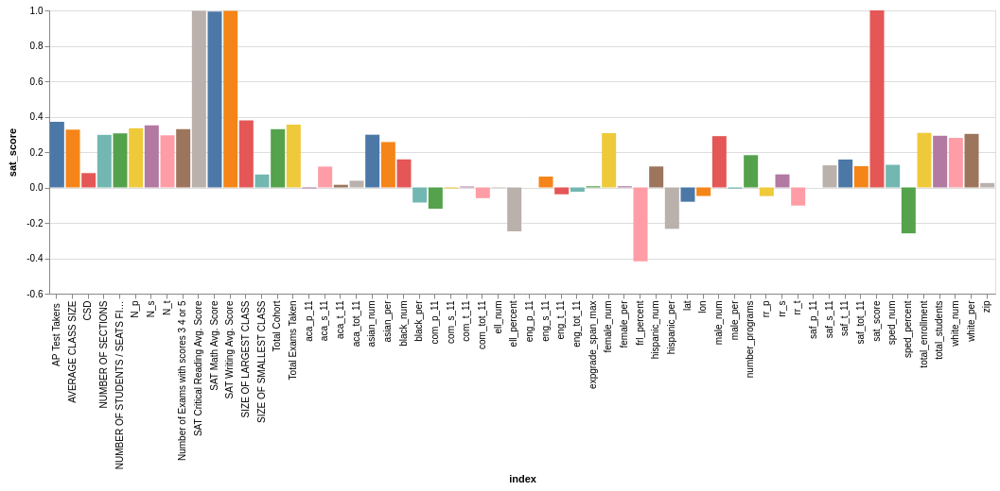

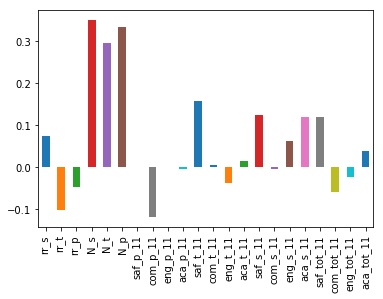

In [19]:
%matplotlib inline
correlations.loc[survey_fields].plot.bar()
alt.Chart(combined.corr().reset_index(level=0)).mark_bar().encode(
    x = 'index',
    y = 'sat_score', 
    color = alt.Color('index:N', legend = None),
    tooltip = ['index:N','sat_score']
).properties(
    width = 1000
)

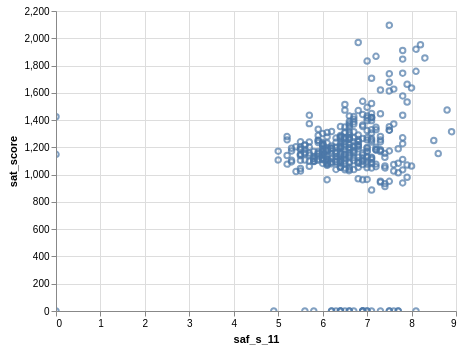

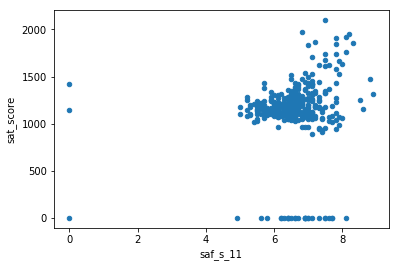

In [20]:
combined.plot.scatter(x='saf_s_11', y='sat_score')

alt.Chart(combined).mark_point().encode(
    x='saf_s_11',
    y='sat_score',
    tooltip = 'SchoolName:N'
).interactive()

In [21]:
'''from mpl_toolkits.basemap import Basemap
m = Basemap(
    projection='merc', 
    llcrnrlat=40.496044, 
    urcrnrlat=40.915256, 
    llcrnrlon=-74.255735, 
    urcrnrlon=-73.700272,
    resolution='i'
)

m.drawmapboundary(fill_color='#85A6D9')
m.drawcoastlines(color='#6D5F47', linewidth=.4)
m.drawrivers(color='#6D5F47', linewidth=.4)

districts = combined.groupby('school_dist').agg(numpy.mean)
districts = districts.reset_index('school_dist')

longitudes = districts['lon'].tolist()
latitudes = districts['lat'].tolist()

m.scatter(longitudes, latitudes, s=20, zorder=2, latlon=True, c=districts["saf_s_11"], cmap="summer" )'''

'from mpl_toolkits.basemap import Basemap\nm = Basemap(\n    projection=\'merc\', \n    llcrnrlat=40.496044, \n    urcrnrlat=40.915256, \n    llcrnrlon=-74.255735, \n    urcrnrlon=-73.700272,\n    resolution=\'i\'\n)\n\nm.drawmapboundary(fill_color=\'#85A6D9\')\nm.drawcoastlines(color=\'#6D5F47\', linewidth=.4)\nm.drawrivers(color=\'#6D5F47\', linewidth=.4)\n\ndistricts = combined.groupby(\'school_dist\').agg(numpy.mean)\ndistricts = districts.reset_index(\'school_dist\')\n\nlongitudes = districts[\'lon\'].tolist()\nlatitudes = districts[\'lat\'].tolist()\n\nm.scatter(longitudes, latitudes, s=20, zorder=2, latlon=True, c=districts["saf_s_11"], cmap="summer" )'

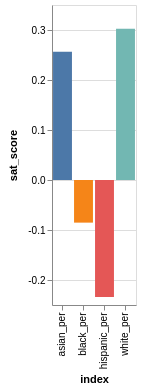

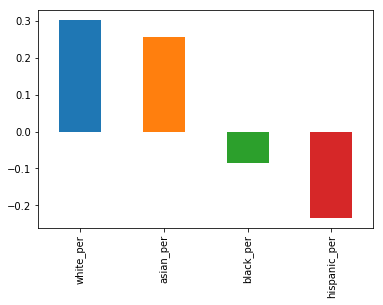

In [22]:
correlations.loc[['white_per','asian_per','black_per', 'hispanic_per',]].plot.bar()
alt.Chart(combined.corr().loc[['white_per','asian_per','black_per', 'hispanic_per',]].reset_index(level=0)).mark_bar().encode(
    x = 'index',
    y = 'sat_score', 
    color = alt.Color('index:N', legend = None),
    tooltip = ['index:N','sat_score']
)

In [23]:
high_hispanic = combined.loc[combined['hispanic_per']>95,:]
high_hispanic['SchoolName']

44             Manhattan Bridges High School
82                                         0
89            GREGORIO LUPERON HS SCI & MATH
125      Academy for Language and Technology
141    International School for Liberal Arts
176                                        0
253                Multicultural High School
286                                        0
Name: SchoolName, dtype: object

In [24]:
low_hispanic = combined.loc[(combined['hispanic_per']<10) &(combined['sat_score']>1800),:]
low_hispanic['SchoolName']

37                           STUYVESANT HS
151                    BRONX HS OF SCIENCE
187                  BROOKLYN TECHNICAL HS
327    Queens HS for Science York Colllege
356             STATEN ISLAND TECHNICAL HS
Name: SchoolName, dtype: object

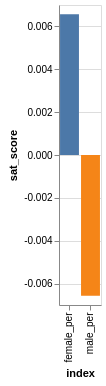

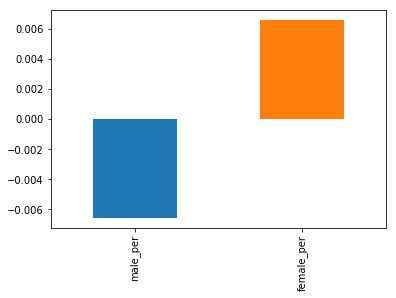

In [25]:
correlations.loc[['male_per', 'female_per']].plot.bar()
alt.Chart(combined.corr().loc[['male_per', 'female_per']].reset_index(level=0)).mark_bar().encode(
    x = 'index',
    y = 'sat_score', 
    color = alt.Color('index:N', legend = None),
    tooltip = ['index:N','sat_score']
)

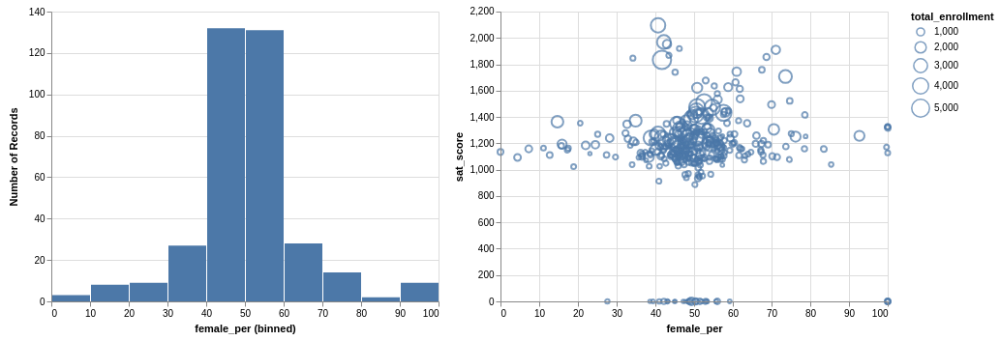

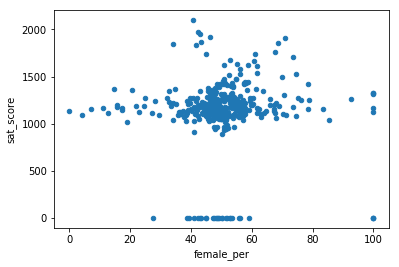

In [34]:
combined.plot.scatter(x='female_per', y='sat_score')
scatter = alt.Chart(combined).mark_point().encode(
    x = 'female_per',
    y = 'sat_score',
    size = 'total_enrollment'
)

hist = alt.Chart(combined).mark_bar().encode(
    alt.X('female_per', bin = True),
    alt.Y('count()')

)

hist | scatter

In [27]:
high_female = combined.loc[(combined['female_per']>60) &(combined['sat_score']>1700),:]
high_female['SchoolName']

5                                  0
26     Eleanor Roosevelt High School
60                     BEACON SCHOOL
61           FIORELLO H.LAGUARDIA HS
302               TOWNSEND HARRIS HS
Name: SchoolName, dtype: object

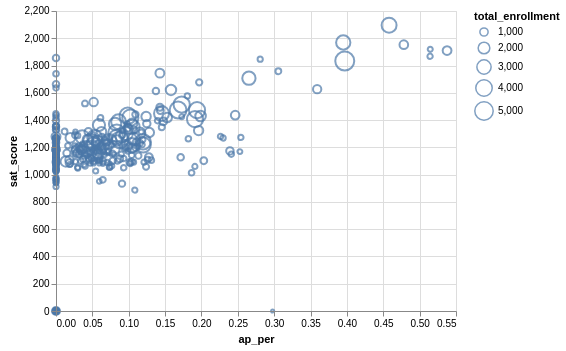

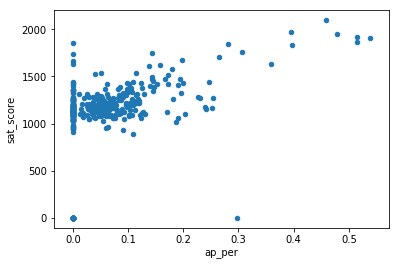

In [28]:
combined['ap_per'] = combined['AP Test Takers '] /combined['total_enrollment']
combined.plot.scatter(x = 'ap_per', y = 'sat_score' )
alt.Chart(combined).mark_point().encode(
    x = 'ap_per',
    y = 'sat_score',
    size = 'total_enrollment',
    tooltip = 'SchoolName:N'
)

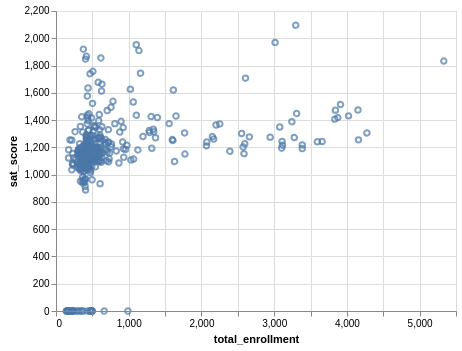

In [29]:
alt.Chart(combined).mark_point().encode(
    x='total_enrollment',
    y='sat_score',
    tooltip = 'SchoolName:N'
)

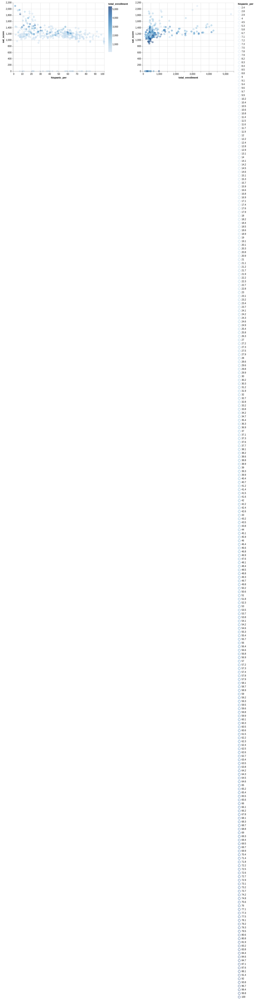

In [37]:
brush =  alt.selection_interval()  
chart1 = alt.Chart(combined).mark_point().encode(
    y='sat_score:Q',
    tooltip = 'SchoolName:N',
    color = alt.condition(brush, 'total_enrollment:Q', alt.value('lightgray'))
).add_selection(
    brush
)

chart1.encode(x='hispanic_per:Q') | chart1.encode(x='total_enrollment:Q' , color=alt.condition(brush, 'hispanic_per:O', alt.value('lightgray')))

In [31]:
print(list(combined.columns.values))

['DBN', 'SCHOOL NAME', 'Num of SAT Test Takers', 'SAT Critical Reading Avg. Score', 'SAT Math Avg. Score', 'SAT Writing Avg. Score', 'sat_score', 'SchoolName', 'AP Test Takers ', 'Total Exams Taken', 'Number of Exams with scores 3 4 or 5', 'Demographic', 'School Name', 'Cohort', 'Total Cohort', 'Total Grads - n', 'Total Grads - % of cohort', 'Total Regents - n', 'Total Regents - % of cohort', 'Total Regents - % of grads', 'Advanced Regents - n', 'Advanced Regents - % of cohort', 'Advanced Regents - % of grads', 'Regents w/o Advanced - n', 'Regents w/o Advanced - % of cohort', 'Regents w/o Advanced - % of grads', 'Local - n', 'Local - % of cohort', 'Local - % of grads', 'Still Enrolled - n', 'Still Enrolled - % of cohort', 'Dropped Out - n', 'Dropped Out - % of cohort', 'CSD', 'NUMBER OF STUDENTS / SEATS FILLED', 'NUMBER OF SECTIONS', 'AVERAGE CLASS SIZE', 'SIZE OF SMALLEST CLASS', 'SIZE OF LARGEST CLASS', 'SCHOOLWIDE PUPIL-TEACHER RATIO', 'Name', 'schoolyear', 'fl_percent', 'frl_percen